# Data science for Crime Prediction

Datasets used:
1.	Toronto Police Open Data Portal MCI 2014 to 2019 dataset: https://data.torontopolice.on.ca/datasets/mci-2014-to-2019
2.	Toronto Police Open Data Portal KSI 2006 to 2019 dataset: https://data.torontopolice.on.ca/datasets/ksi
3.	City of Toronto Open Data Portal Wellbeing Toronto – Youth Services 2016: https://open.toronto.ca/dataset/wellbeing-toronto-youth-services/ 
4.	City of Toronto Open Data Portal – Places of Worship 2006:      https://open.toronto.ca/dataset/places-of-worship/
5.	City of Toronto Open Data Portal – Community Housing 2019:  https://open.toronto.ca/dataset/toronto-community-housing-data/ 
6.	City of Toronto Open Data Portal – Social Housing Unit Density 2014:  https://open.toronto.ca/dataset/social-housing-unit-density-by-neighbourhoods/ 
7.	Toronto Police Open Data Portal - Neighbourhood Crime Rates 2014 - 2019 https://data.torontopolice.on.ca/pages/catalogue 
8.	Toronto Police Open Data Portal Catalogue – Police Facilities locations file https://data.torontopolice.on.ca/pages/catalogue 


## Dependent Variable
### Major Crime Indicators (MCIs) - MCI 2014 to 2019

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px
import seaborn as sn

py.init_notebook_mode(connected=True)

In [101]:
df = pd.read_csv('1_open_Data\MCI_2014_to_2019.csv',parse_dates=['occurrencedate'])

#### Number of records

In [102]:
df.shape

(206435, 30)

#### Fields

In [104]:
df.head()

,X,Y,Index_,event_unique_id,occurrencedate,occ_date,reporteddate,premisetype,ucr_code,ucr_ext,...,occurrencedayofyear,occurrencedayofweek,occurrencehour,MCI,Division,Hood_ID,Neighbourhood,Lat,Long,ObjectId
0,-8840548.681,5431712.281,201,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,1
1,-8840548.681,5431712.281,202,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,2
2,-8840548.681,5431712.281,203,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,3
3,-8840548.681,5431712.281,204,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,4
4,-8839880.764,5413805.692,205,GO-20141300854,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Commercial,2120,200,...,7.0,Tuesday,21,Break and Enter,D14,79,University (79),43.665390,-79.410,5


#### Fields and data types

In [18]:
df.dtypes

X                                  float64
Y                                  float64
Index_                               int64
event_unique_id                     object
occurrencedate         datetime64[ns, UTC]
occ_date                            object
reporteddate                        object
premisetype                         object
ucr_code                             int64
ucr_ext                              int64
offence                             object
reportedyear                         int64
reportedmonth                       object
reportedday                          int64
reporteddayofyear                    int64
reporteddayofweek                   object
reportedhour                         int64
occurrenceyear                     float64
occurrencemonth                     object
occurrenceday                      float64
occurrencedayofyear                float64
occurrencedayofweek                 object
occurrencehour                       int64
MCI        

#### Count of records per year

In [82]:
df.groupby('occurrenceyear')['event_unique_id'].count()

occurrenceyear
2000.0       14
2001.0       13
2002.0        9
2003.0       10
2004.0       15
2005.0       17
2006.0        8
2007.0       24
2008.0       35
2009.0       49
2010.0       75
2011.0       91
2012.0      159
2013.0      536
2014.0    31638
2015.0    32316
2016.0    32809
2017.0    34561
2018.0    36323
2019.0    37674
Name: event_unique_id, dtype: int64

## Filter for 2014-2019

In [7]:
df = df[df['occurrenceyear'] >= 2014]

In [4]:
df['occurrenceyear'].unique()

array([2014., 2015., 2016., 2017., 2018., 2019.])

#### Number of records after filter

In [66]:
df.shape

(205321, 30)

In [85]:
df.head()

,X,Y,Index_,event_unique_id,occurrencedate,occ_date,reporteddate,premisetype,ucr_code,ucr_ext,...,occurrencedayofyear,occurrencedayofweek,occurrencehour,MCI,Division,Hood_ID,Neighbourhood,Lat,Long,ObjectId
0,-8840548.681,5431712.281,201,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,1
1,-8840548.681,5431712.281,202,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,2
2,-8840548.681,5431712.281,203,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,3
3,-8840548.681,5431712.281,204,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,4
4,-8839880.764,5413805.692,205,GO-20141300854,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Commercial,2120,200,...,7.0,Tuesday,21,Break and Enter,D14,79,University (79),43.665390,-79.410,5


#### Check for nulls

In [345]:
df.isnull().sum()

X                      0
Y                      0
Index_                 0
event_unique_id        0
occurrencedate         0
occ_date               0
reporteddate           0
premisetype            0
ucr_code               0
ucr_ext                0
offence                0
reportedyear           0
reportedmonth          0
reportedday            0
reporteddayofyear      0
reporteddayofweek      0
reportedhour           0
occurrenceyear         0
occurrencemonth        0
occurrenceday          0
occurrencedayofyear    0
occurrencedayofweek    0
occurrencehour         0
MCI                    0
Division               0
Hood_ID                0
Neighbourhood          0
Lat                    0
Long                   0
ObjectId               0
dtype: int64

### MCI Descriptive statistics

In [86]:
df.describe()

,X,Y,Index_,ucr_code,ucr_ext,reportedyear,reportedday,reporteddayofyear,reportedhour,occurrenceyear,occurrenceday,occurrencedayofyear,occurrencehour,Hood_ID,Lat,Long,ObjectId
count,2.053210e+05,2.053210e+05,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000
mean,-8.838215e+06,5.420264e+06,103443.021245,1697.213807,146.077912,2016.626833,15.748711,187.394451,12.832345,2016.607035,15.546023,186.552579,12.576775,72.210086,43.707322,-79.395037,103442.851769
std,1.161402e+04,8.117647e+03,59529.664987,323.552963,51.749843,1.714717,8.769403,103.537580,6.590369,1.712493,8.882357,103.724321,7.208911,40.749973,0.052708,0.104331,59529.844943
min,-8.865373e+06,5.401765e+06,1.000000,1410.000000,100.000000,2014.000000,1.000000,1.000000,0.000000,2014.000000,1.000000,1.000000,0.000000,1.000000,43.587093,-79.639000,1.000000
25%,-8.846671e+06,5.413154e+06,52045.000000,1430.000000,100.000000,2015.000000,8.000000,100.000000,8.000000,2015.000000,8.000000,99.000000,7.000000,36.000000,43.661152,-79.471000,52046.000000
50%,-8.837988e+06,5.419301e+06,103522.000000,1450.000000,100.000000,2017.000000,16.000000,189.000000,14.000000,2017.000000,16.000000,188.000000,14.000000,76.000000,43.701092,-79.393000,103522.000000
75%,-8.829862e+06,5.427154e+06,154958.000000,2120.000000,200.000000,2018.000000,23.000000,277.000000,18.000000,2018.000000,23.000000,276.000000,19.000000,108.000000,43.752068,-79.320000,154958.000000
max,-8.807932e+06,5.442380e+06,206435.000000,2135.000000,230.000000,2019.000000,31.000000,366.000000,23.000000,2019.000000,31.000000,366.000000,23.000000,140.000000,43.850788,-79.123000,206435.000000


#### Number of neighbourhoods in Toronto

In [10]:

df['Neighbourhood'].nunique()

140

#### Crime occurrences over time

In [8]:
crime_date = df.groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

crime_date.head()

,occurrenceyear,occurrencemonth,occurrencedate,count
4,2014.0,January,2014-01-01 05:00:00+00:00,2448
3,2014.0,February,2014-02-01 05:00:00+00:00,2203
7,2014.0,March,2014-03-01 05:00:00+00:00,2420
0,2014.0,April,2014-04-01 04:00:00+00:00,2509
8,2014.0,May,2014-05-01 04:00:00+00:00,2856


In [9]:
data = go.Scatter(x=crime_date['occurrencedate'], y=crime_date['count'])

py.iplot([data])

### MCIs by DIvision

In [367]:
div_yr = df.groupby(['Division', 'occurrenceyear'])['event_unique_id'].count().unstack()
div_yr

occurrenceyear,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
Division,,,,,,
D11,1242,1392,1288,1364,1518,1535
D12,1472,1467,1518,1454,1470,1484
D13,1083,1136,1196,1243,1326,1390
D14,2284,2276,2461,2601,2689,2833
D22,1982,2000,2004,2087,2246,2225
D23,2064,2069,2250,2258,2473,2311
D31,2227,2299,2406,2554,2568,2871
D32,2343,2263,2477,2625,2797,2792
D33,1527,1530,1458,1533,1526,1624


#### Descriptive statistics by Division

In [369]:
div_yr.describe()

occurrenceyear,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
count,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000
mean,1861.058824,1900.941176,1929.941176,2033.000000,2136.647059,2216.117647
std,476.935854,473.521313,512.643818,589.437338,608.352790,667.886300
min,1083.000000,1136.000000,1196.000000,1243.000000,1326.000000,1353.000000
25%,1472.000000,1447.000000,1436.000000,1454.000000,1518.000000,1535.000000
50%,1941.000000,2050.000000,2004.000000,2240.000000,2284.000000,2311.000000
75%,2284.000000,2276.000000,2461.000000,2601.000000,2570.000000,2697.000000
max,2597.000000,2691.000000,2553.000000,2796.000000,3229.000000,3712.000000


#### Number of crimes by division

In [348]:
div_count = df.groupby('Division')['event_unique_id'].count()
div_count

Division
D11     8339
D12     8865
D13     7374
D14    15144
D22    12544
D23    13425
D31    14925
D32    15297
D33     9198
D41    15574
D42    12967
D43    15543
D51    16865
D52    13062
D53     9500
D54     8508
D55     8191
Name: event_unique_id, dtype: int64

#### Avg crimes per division per year

In [349]:
print("Avg crime occurrences per division")
div_count.mean()/6


Avg crime occurrences per division


2012.9509803921567

## MCIs by Neighbourhood

#### Number of crimes per neighbourhood

In [22]:
hood_count = df.groupby('Neighbourhood')['event_unique_id'].count()
hood_count

Neighbourhood
Agincourt North (129)                 1154
Agincourt South-Malvern West (128)    1632
Alderwood (20)                         543
Annex (95)                            2907
Banbury-Don Mills (42)                1198
                                      ... 
Wychwood (94)                          800
Yonge-Eglinton (100)                   820
Yonge-St.Clair (97)                    409
York University Heights (27)          3967
Yorkdale-Glen Park (31)               1985
Name: event_unique_id, Length: 140, dtype: int64

#### Avg crimes per neighbourhood per year

In [353]:
print("Avg crime occurrences per neighbourhood")
hood_count.mean()/6

Avg crime occurrences per neighbourhood


244.4297619047619

#### Descriptive Statistics - Crimes by neighbourhood 

In [370]:
hood_count.describe()

count     140.000000
mean     1466.578571
std      1230.786063
min       350.000000
25%       704.750000
50%      1126.500000
75%      1725.250000
max      7707.000000
Name: event_unique_id, dtype: float64

#### Number of crimese by neighbourhood by year

In [371]:
hood_yr = df.groupby(['Neighbourhood', 'occurrenceyear'])['event_unique_id'].count().unstack()
hood_yr

occurrenceyear,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
Neighbourhood,,,,,,
Agincourt North (129),175,188,160,184,237,210
Agincourt South-Malvern West (128),258,229,264,290,282,309
Alderwood (20),92,99,103,73,91,85
Annex (95),434,406,454,477,538,598
Banbury-Don Mills (42),169,227,179,204,205,214
...,...,...,...,...,...,...
Wychwood (94),110,138,141,125,154,132
Yonge-Eglinton (100),131,126,111,113,155,184
Yonge-St.Clair (97),69,62,73,55,71,79


#### Descriptive statistics - Crime by neighbourhood by year

In [372]:
hood_yr.describe()

occurrenceyear,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
count,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000
mean,225.985714,230.828571,234.350000,246.864286,259.450000,269.100000
std,173.467182,185.093286,193.225627,215.881936,234.916955,239.883944
min,52.000000,49.000000,45.000000,49.000000,58.000000,45.000000
25%,111.750000,113.750000,111.750000,116.000000,116.750000,123.750000
50%,169.500000,171.500000,173.000000,176.000000,191.500000,193.000000
75%,272.000000,269.500000,284.250000,306.750000,301.250000,307.500000
max,1060.000000,1165.000000,1261.000000,1379.000000,1469.000000,1396.000000


#### Distribution of neighbourhood crime

In [10]:
hoods = df['Neighbourhood'].value_counts()
hoods

Waterfront Communities-The Island (77)    7707
Bay Street Corridor (76)                  6800
Church-Yonge Corridor (75)                6217
West Humber-Clairville (1)                5680
Moss Park (73)                            4768
                                          ... 
Yonge-St.Clair (97)                        409
Guildwood (140)                            407
Maple Leaf (29)                            403
Woodbine-Lumsden (60)                      369
Lambton Baby Point (114)                   350
Name: Neighbourhood, Length: 140, dtype: int64

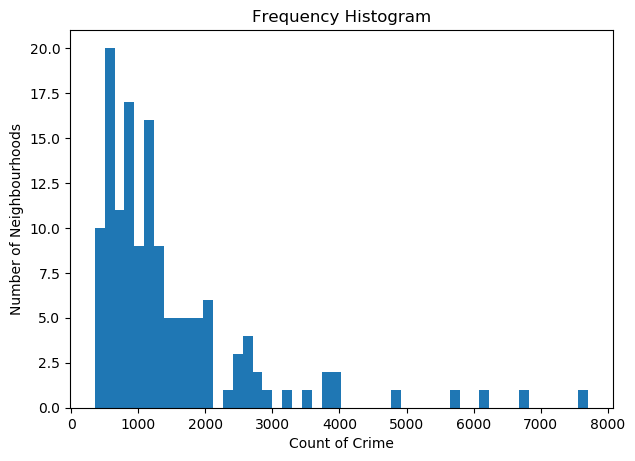

In [19]:
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})

plt.hist(hoods, bins=50)
plt.gca().set(title='Frequency Histogram', ylabel='Number of Neighbourhoods', xlabel='Count of Crime');

In [13]:
data = go.Bar(
    x=hoods.index,
    y=hoods.values
)

layout = go.Layout(
    title='Crime Distribution by Neighbourhood (2014 - 2019)'
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

# Crime Types

#### Number of crimes by type

In [16]:
crime_types = df['MCI'].value_counts()

crime_types

Assault            110609
Break and Enter     43214
Auto Theft          23330
Robbery             21500
Theft Over           6668
Name: MCI, dtype: int64

In [17]:
data = go.Bar(
    x=crime_types.index,
    y=crime_types.values)

layout = go.Layout(
    title='Crime Types Distribution (2014 - 2019)')

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

### Crime by type over time

In [20]:
df['MCI'].unique()

array(['Assault', 'Break and Enter', 'Robbery', 'Theft Over',
       'Auto Theft'], dtype=object)

In [24]:
robbery_date = df \
    [df['MCI'] == 'Robbery'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

auto_date = df \
    [df['MCI'] == 'Auto Theft'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

assault_date = df \
    [df['MCI'] == 'Assault'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

theft_date = df \
    [df['MCI'] == 'Theft Over'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

BE_date = df \
    [df['MCI'] == 'Break and Enter'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')


In [25]:
trace_robbery = go.Scatter(
    x=robbery_date['occurrencedate'],
    y=robbery_date['count'],
    name = 'Robbery' 
)    

trace_auto = go.Scatter(
    x=auto_date['occurrencedate'],
    y=auto_date['count'],
    name = 'Auto Theft'
)    

trace_assault= go.Scatter(
    x=assault_date['occurrencedate'],
    y=assault_date['count'],
    name = 'Assault'
)

trace_theft= go.Scatter(
    x=theft_date['occurrencedate'],
    y=theft_date['count'],
    name = 'Theft Over'
)

trace_BE= go.Scatter(
    x=BE_date['occurrencedate'],
    y=BE_date['count'],
    name = 'Break and Enter'
)

data = [trace_robbery, trace_auto, trace_assault, trace_theft, trace_BE]

py.iplot(data)

##### Frequency Distribution by crime type

In [27]:
hood_crimetype = df.groupby(['Neighbourhood', 'MCI'], as_index=False) \
    .agg({'event_unique_id': 'count'}) \
    .rename(columns={'event_unique_id': 'count'})
    #.sort_values('occurrencedate')
hood_crimetype.head()

,Neighbourhood,MCI,count
0,Agincourt North (129),Assault,447
1,Agincourt North (129),Auto Theft,178
2,Agincourt North (129),Break and Enter,320
3,Agincourt North (129),Robbery,181
4,Agincourt North (129),Theft Over,28


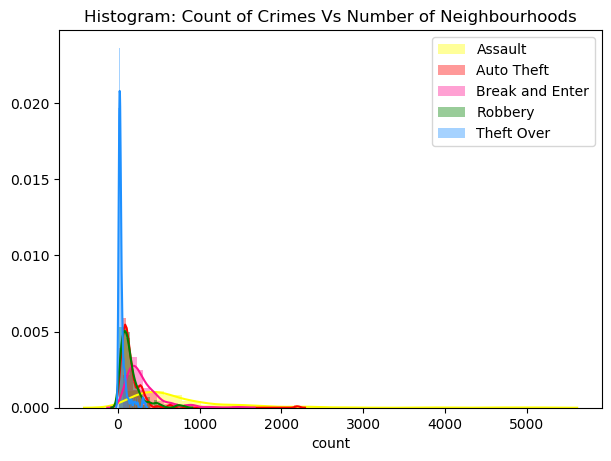

In [30]:
plt.subplots(figsize=(7,5), dpi=100)
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Assault', "count"] , color="yellow", label="Assault")
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Auto Theft', "count"] , color="red", label="Auto Theft")
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Break and Enter', "count"] , color="deeppink", label="Break and Enter")
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Robbery', "count"] , color="green", label="Robbery")
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Theft Over', "count"] , color="dodgerblue", label="Theft Over")
plt.title('Histogram: Count of Crimes Vs Number of Neighbourhoods')
plt.legend();

#### Descriptive Statistics by Crime Type

In [123]:
mci_hood = pd.pivot_table(df, values="event_unique_id", index=['Neighbourhood'],\
                      columns=['MCI'],\
                      aggfunc=lambda x: x.count())

mci_hood

MCI,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
Neighbourhood,,,,,
Agincourt North (129),447,178,320,181,28
Agincourt South-Malvern West (128),690,220,479,163,80
Alderwood (20),216,97,148,41,41
Annex (95),1476,132,884,245,170
Banbury-Don Mills (42),479,131,438,90,60
...,...,...,...,...,...
Wychwood (94),421,79,204,83,13
Yonge-Eglinton (100),453,54,168,117,28
Yonge-St.Clair (97),185,26,140,34,24


In [125]:
mci_hood[["Assault","Auto Theft", "Break and Enter", "Robbery", "Theft Over" ]].describe()

MCI,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
count,140.000000,140.000000,140.000000,140.000000,140.000000
mean,790.064286,166.642857,308.671429,153.571429,47.628571
std,770.681173,209.722704,220.220179,138.867057,55.913389
min,111.000000,16.000000,63.000000,20.000000,7.000000
25%,354.750000,79.750000,167.750000,70.250000,20.750000
50%,576.500000,112.500000,244.500000,120.500000,30.500000
75%,952.000000,186.000000,386.250000,182.250000,49.250000
max,5091.000000,2195.000000,1482.000000,812.000000,334.000000


## Crime by Premise Type

#### Number of crimes by premise type

In [63]:
premise_types = df['premisetype'].value_counts()
premise_types

Outside       54158
Apartment     49530
Commercial    40955
House         37589
Other         23089
Name: premisetype, dtype: int64

In [64]:
data = go.Bar(
    x=premise_types.index,
    y=premise_types.values
)

layout = go.Layout(
    title='Crime by Premise Type Distribution (2014 - 2019)')

fig = go.Figure(data=[data], layout=layout)
py.iplot(fig)

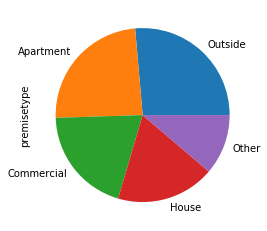

In [366]:
df['premisetype'].value_counts().plot(kind='pie')

#### Crime type by premise type

In [45]:
premise = pd.pivot_table(df, values="event_unique_id", index=['premisetype'],\
                      columns=['MCI'],\
                      aggfunc=lambda x: x.count())

premise

MCI,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
premisetype,,,,,
Apartment,34454,518,11616,1946,996
Commercial,17542,2362,13657,5056,2338
House,13863,6640,15299,640,1147
Other,17635,607,2618,1741,488
Outside,27115,13203,24,12117,1699


##### See report for chart

In [47]:
#premise.to_csv("2_Output/premise_MCI_table.csv")

### Time of Day Transformation

In [49]:
timeframes = [ \
            (df['occurrencehour'] >=20),\
            (df['occurrencehour'] >=0) & (df['occurrencehour'] <=4), \
            (df['occurrencehour'] >4) & (df['occurrencehour'] <=12), \
            (df['occurrencehour'] >12) & (df['occurrencehour'] <=20) \
             ]
              

In [50]:
time_values = ['Night', 'Night', 'Morning', 'Afternoon']

In [51]:
df['TOD'] = np.select(timeframes, time_values)

In [52]:
df['occurrencehour'].unique()

array([22, 21, 11,  0,  2, 17, 19, 10,  3, 18, 14, 20, 15,  7,  1, 12,  4,
       16, 23,  8, 13,  9,  5,  6], dtype=int64)

In [37]:
df.head()

,X,Y,Index_,event_unique_id,occurrencedate,occ_date,reporteddate,premisetype,ucr_code,ucr_ext,...,occurrencedayofweek,occurrencehour,MCI,Division,Hood_ID,Neighbourhood,Lat,Long,ObjectId,TOD
0,-8840548.681,5431712.281,201,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,1,Night
1,-8840548.681,5431712.281,202,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,2,Night
2,-8840548.681,5431712.281,203,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,3,Night
3,-8840548.681,5431712.281,204,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,4,Night
4,-8839880.764,5413805.692,205,GO-20141300854,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Commercial,2120,200,...,Tuesday,21,Break and Enter,D14,79,University (79),43.665390,-79.410,5,Night


In [53]:
df['TOD'].unique()

array(['Night', 'Morning', 'Afternoon'], dtype=object)

#### Crime Types by Time of Day (TOD)

In [54]:
tod_table = pd.pivot_table(df, values="event_unique_id", index=['TOD'],\
                      columns=['MCI'],\
                      aggfunc=lambda x: x.count())

tod_table

MCI,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
TOD,,,,,
Afternoon,38785,7132,12309,7777,2558
Morning,26510,5020,14183,3213,1971
Night,45314,11178,16722,10510,2139


In [40]:
#tod_table.to_csv("2_Output/tod_table_3breaks.csv")

##### See report for chart

##### Total Crime by Day of Week - see report for break out by crime type done in excel

In [62]:
fig = px.histogram(df, y="occurrencedayofweek",color="occurrencedayofweek")
fig.update_layout(
    title_text='Crime count on each day', 
    xaxis_title_text='Day',
    yaxis_title_text='Crimes Count', 
    bargap=0.2, 
    bargroupgap=0.1
)
fig.show()

# PLANNING

## Reviewing aggregated data

#### Aggregate by year, month, day, time

##### Counts of crime are too low for prediction models

In [76]:
Agg_ymdt = df.groupby([\
            'Hood_ID', 'Neighbourhood', 'occurrenceyear','occurrencemonth', \
            'occurrencedayofweek','TOD'], as_index=False) \
            .agg({'event_unique_id': 'count'}) \
            .rename(columns={'event_unique_id': 'count'}) \
            .sort_values(by=['Hood_ID','count'], ascending=False)

Agg_ymdt

,Hood_ID,Neighbourhood,occurrenceyear,occurrencemonth,occurrencedayofweek,TOD,count
126301,140,Guildwood (140),2014.0,February,Sunday,Night,5
126530,140,Guildwood (140),2018.0,February,Tuesday,Evening,5
126296,140,Guildwood (140),2014.0,December,Sunday,Night,4
126363,140,Guildwood (140),2015.0,February,Sunday,Night,4
126414,140,Guildwood (140),2016.0,December,Monday,Night,4
...,...,...,...,...,...,...,...
2332,1,West Humber-Clairville (1),2019.0,September,Sunday,Late Night,1
2333,1,West Humber-Clairville (1),2019.0,September,Sunday,Morning,1
2337,1,West Humber-Clairville (1),2019.0,September,Tuesday,Afternoon,1
2342,1,West Humber-Clairville (1),2019.0,September,Wednesday,Late Morning,1


#### Aggregate by year and month

##### Crime counts by year and month are too low for prediction models, only 100 records with more than 100 crimes

In [41]:
Agg_ym = df.groupby([\
            'Hood_ID', 'Neighbourhood', 'occurrenceyear','occurrencemonth'] \
            , as_index=False) \
            .agg({'event_unique_id': 'count'}) \
            .rename(columns={'event_unique_id': 'count'}) \
            .sort_values(by=['count','Hood_ID'], ascending=False)

Agg_ym

,Hood_ID,Neighbourhood,occurrenceyear,occurrencemonth,count
5386,75,Church-Yonge Corridor (75),2019.0,June,176
5505,77,Waterfront Communities-The Island (77),2017.0,July,155
5530,77,Waterfront Communities-The Island (77),2019.0,June,154
5458,76,Bay Street Corridor (76),2019.0,June,154
5523,77,Waterfront Communities-The Island (77),2018.0,September,146
...,...,...,...,...,...
907,13,Etobicoke West Mall (13),2017.0,September,1
929,13,Etobicoke West Mall (13),2019.0,November,1
292,5,Elms-Old Rexdale (5),2014.0,January,1
177,3,Thistletown-Beaumond Heights (3),2016.0,November,1


In [209]:
#Agg_ym.to_csv("2_Output\Agg_ym_test.csv")

In [80]:
Agg_ym.shape

(10061, 5)

In [84]:
Agg_ym[Agg_ym['count'] >= 100]

,Hood_ID,Neighbourhood,occurrenceyear,occurrencemonth,count
5386,75,Church-Yonge Corridor (75),2019.0,June,176
5505,77,Waterfront Communities-The Island (77),2017.0,July,155
5530,77,Waterfront Communities-The Island (77),2019.0,June,154
5458,76,Bay Street Corridor (76),2019.0,June,154
5523,77,Waterfront Communities-The Island (77),2018.0,September,146
...,...,...,...,...,...
5366,75,Church-Yonge Corridor (75),2017.0,October,101
5245,73,Moss Park (73),2019.0,November,101
45,1,West Humber-Clairville (1),2017.0,November,101
5492,77,Waterfront Communities-The Island (77),2016.0,January,100


### Map crimes by neighbourhood

Display interactive maps
Get mapbox api key:
https://www.mapbox.com/studio

In [31]:
mapbox_access_token = 'pk.eyJ1IjoibmhhdDQxNiIsImEiOiJjazBhYTlrZjgwaGtnM2hwcXkxdHVidXd1In0.ewuvGQgnflGsUYb6feZzbA'

In [32]:
neighbourhoods = df \
    .groupby('Neighbourhood') \
    .agg({'Lat': 'mean', 'Long': 'mean', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'})

In [33]:
neighbourhoods

,Lat,Long,count
Neighbourhood,,,
Agincourt North (129),43.807288,-79.270261,1154
Agincourt South-Malvern West (128),43.788147,-79.266615,1632
Alderwood (20),43.605258,-79.542029,543
Annex (95),43.670535,-79.401907,2907
Banbury-Don Mills (42),43.735631,-79.346256,1198
...,...,...,...
Wychwood (94),43.678670,-79.425899,800
Yonge-Eglinton (100),43.705352,-79.400793,820
Yonge-St.Clair (97),43.688536,-79.396760,409


In [34]:
data = [
    go.Scattermapbox(
        lat=neighbourhoods['Lat'],
        lon=neighbourhoods['Long'],
        mode='markers',
        marker = {
            'size': neighbourhoods['count'] / 5,
            'sizemode': 'area',
            'color': neighbourhoods['count'] / 5,
            'colorscale': 'Viridis',
            'opacity': 0.9
        }
    )
]

layout = go.Layout(
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=43.6532,
            lon=-79.3832
        ),
        pitch=0,
        zoom=9
    ),
)

fig = dict(data=data, layout=layout)

py.iplot(fig)

# Independent Variables

## City of Toronto Open data and KSI Toronto Police

In [39]:
features = pd.read_csv("1_open_Data\INDICATORS_final.csv")

In [40]:
features.head()

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,...,Robbery,Theft Over,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km
0,West Humber-Clairville,1,33312,795.5,1446.9,396.3,6.0,210.1,189.1,3.014532e+07,...,550,310,170,15,6,37,950,0,1,5
1,Mount Olive-Silverstone-Jamestown,2,32954,813.3,267.0,109.2,9.1,166.9,27.3,4.637542e+06,...,462,26,52,13,103,4,1288,1,3,4
2,Thistletown-Beaumond Heights,3,10360,714.3,482.6,125.5,0.0,67.6,29.0,3.339481e+06,...,90,14,31,5,30,9,372,1,3,5
3,Rexdale-Kipling,4,10529,588.8,474.9,142.5,19.0,218.4,28.5,2.505576e+06,...,121,9,29,1,15,3,308,0,3,6
4,Elms-Old Rexdale,5,9456,708.5,296.1,105.8,0.0,148.1,42.3,2.931145e+06,...,81,9,1,4,14,2,358,0,3,8


In [41]:
features.dtypes

Neighbourhood               object
Hood_ID                      int64
Population                   int64
Assault_Rate_2019          float64
AutoTheft_Rate_2019        float64
BreakandEnter_Rate_2019    float64
Homicide_Rate_2019         float64
Robbery_Rate_2019          float64
TheftOver_Rate_2019        float64
Shape__Area                float64
Shape__Length              float64
Assault                      int64
Auto Theft                   int64
Break and Enter              int64
Robbery                      int64
Theft Over                   int64
KSI                          int64
TotalYouthServices           int64
CommunityHousing             int64
PlacesOfWorship              int64
SocialHousing                int64
TPSFacilities_2km            int64
TPSFacilities_5km            int64
TPSFacilities_10km           int64
dtype: object

## Transform TPSFacilities into binary values

In [42]:
features['TPSFacilities_2km_TF'] = (features['TPSFacilities_2km'] >=1).astype(int)

In [43]:
features['TPSFacilities_2km_TF'].unique()

array([0, 1])

#### No missing values

In [44]:
features.isnull().sum()

Neighbourhood              0
Hood_ID                    0
Population                 0
Assault_Rate_2019          0
AutoTheft_Rate_2019        0
BreakandEnter_Rate_2019    0
Homicide_Rate_2019         0
Robbery_Rate_2019          0
TheftOver_Rate_2019        0
Shape__Area                0
Shape__Length              0
Assault                    0
Auto Theft                 0
Break and Enter            0
Robbery                    0
Theft Over                 0
KSI                        0
TotalYouthServices         0
CommunityHousing           0
PlacesOfWorship            0
SocialHousing              0
TPSFacilities_2km          0
TPSFacilities_5km          0
TPSFacilities_10km         0
TPSFacilities_2km_TF       0
dtype: int64

#### Number of neighbourhoods in independent variables

In [45]:
features.shape

(140, 25)

In [72]:
features.dtypes

Neighbourhood               object
Hood_ID                      int64
Population                   int64
Assault_Rate_2019          float64
AutoTheft_Rate_2019        float64
BreakandEnter_Rate_2019    float64
Homicide_Rate_2019         float64
Robbery_Rate_2019          float64
TheftOver_Rate_2019        float64
Shape__Area                float64
Shape__Length              float64
Assault                      int64
Auto Theft                   int64
Break and Enter              int64
Robbery                      int64
Theft Over                   int64
KSI                          int64
TotalYouthServices           int64
CommunityHousing             int64
PlacesOfWorship              int64
SocialHousing                int64
TPSFacilities_2km            int64
TPSFacilities_5km            int64
TPSFacilities_10km           int64
TPSFacilities_2km_TF         int32
dtype: object

### Aggregate MCI counts to neighbourhood and TOD

In [55]:
table = pd.pivot_table(df, values="event_unique_id", index=['Hood_ID','TOD'],\
                      columns=['MCI'],\
                      aggfunc=lambda x: x.count())

table
    


MCI                Assault  Auto Theft  Break and Enter  Robbery  Theft Over
Hood_ID TOD                                                                 
1       Afternoon    619.0       659.0            197.0    171.0        99.0
        Morning      451.0       600.0            225.0     76.0        96.0
        Night        729.0       936.0            404.0    303.0       115.0
2       Afternoon    635.0       125.0             68.0    201.0         7.0
        Morning      350.0        76.0             58.0     70.0        12.0
...                    ...         ...              ...      ...         ...
139     Morning      208.0        18.0             95.0     17.0         6.0
        Night        438.0        48.0             88.0     83.0         5.0
140     Afternoon     89.0         2.0             19.0     19.0         5.0
        Morning       92.0         6.0             43.0      4.0         4.0
        Night         64.0         8.0             25.0     26.0         1.0

[420 rows x 5 columns]

In [96]:
#table.to_csv("2_Output\CountMCIby_Hood_TOD.csv", index=False)

In [89]:
table = pd.read_csv("2_Output\CountMCIby_Hood_TOD.csv")

In [90]:
table.head()

,Unnamed: 0,Hood_ID,TOD,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
0,0,1,Afternoon,619,659,197,171,99
1,1,1,Morning,451,600,225,76,96
2,2,1,Night,729,936,404,303,115
3,3,2,Afternoon,635,125,68,201,7
4,4,2,Morning,350,76,58,70,12


In [91]:
table=table.drop(['Unnamed: 0'], axis=1)

##### Check for missing values

In [92]:
table.isnull().sum()

Hood_ID            0
TOD                0
Assault            0
Auto Theft         0
Break and Enter    0
Robbery            0
Theft Over         0
dtype: int64

#### Check data types

In [93]:
table.dtypes

Hood_ID             int64
TOD                object
Assault             int64
Auto Theft          int64
Break and Enter     int64
Robbery             int64
Theft Over          int64
dtype: object

In [106]:
table.shape

(420, 7)

#### Features (Independent variables)

In [73]:
features1 = features.iloc[:,[1,2,16,17,18,19,20,21,22,23,24]]
features1

,Hood_ID,Population,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km,TPSFacilities_2km_TF
0,1,33312,170,15,6,37,950,0,1,5,0
1,2,32954,52,13,103,4,1288,1,3,4,1
2,3,10360,31,5,30,9,372,1,3,5,1
3,4,10529,29,1,15,3,308,0,3,6,0
4,5,9456,1,4,14,2,358,0,3,8,0
...,...,...,...,...,...,...,...,...,...,...,...
135,136,27392,31,15,26,11,2052,1,1,4,1
136,137,53485,161,32,26,27,2594,0,2,7,0
137,138,22776,57,10,12,4,885,0,2,8,0
138,139,16724,36,2,3,5,788,0,2,5,0


In [98]:
features1.dtypes

Hood_ID                 int64
Population              int64
KSI                     int64
TotalYouthServices      int64
CommunityHousing        int64
PlacesOfWorship         int64
SocialHousing           int64
TPSFacilities_2km       int64
TPSFacilities_5km       int64
TPSFacilities_10km      int64
TPSFacilities_2km_TF    int32
dtype: object

## Dependent and Independent Variables

### Join MCIs Target to features

In [94]:
join = pd.merge( \
    table, \
    features1, \
    how="left", \
    ##on=None,
    left_on='Hood_ID', \
    right_on='Hood_ID', \
    left_index=False,
    right_index=False,
    sort=True,
    suffixes=("_x", "_y"),
    copy=True,
    indicator=False,
    validate=None,
)

join

,Hood_ID,TOD,Assault,Auto Theft,Break and Enter,Robbery,Theft Over,Population,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km,TPSFacilities_2km_TF
0,1,Afternoon,619,659,197,171,99,33312,170,15,6,37,950,0,1,5,0
1,1,Morning,451,600,225,76,96,33312,170,15,6,37,950,0,1,5,0
2,1,Night,729,936,404,303,115,33312,170,15,6,37,950,0,1,5,0
3,2,Afternoon,635,125,68,201,7,32954,52,13,103,4,1288,1,3,4,1
4,2,Morning,350,76,58,70,12,32954,52,13,103,4,1288,1,3,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,139,Morning,208,18,95,17,6,16724,36,2,3,5,788,0,2,5,0
416,139,Night,438,48,88,83,5,16724,36,2,3,5,788,0,2,5,0
417,140,Afternoon,89,2,19,19,5,9917,12,0,0,3,48,0,1,5,0
418,140,Morning,92,6,43,4,4,9917,12,0,0,3,48,0,1,5,0


In [95]:
join.shape

(420, 17)

In [96]:
join.isnull().sum()

Hood_ID                 0
TOD                     0
Assault                 0
Auto Theft              0
Break and Enter         0
Robbery                 0
Theft Over              0
Population              0
KSI                     0
TotalYouthServices      0
CommunityHousing        0
PlacesOfWorship         0
SocialHousing           0
TPSFacilities_2km       0
TPSFacilities_5km       0
TPSFacilities_10km      0
TPSFacilities_2km_TF    0
dtype: int64

##### Scatter plot

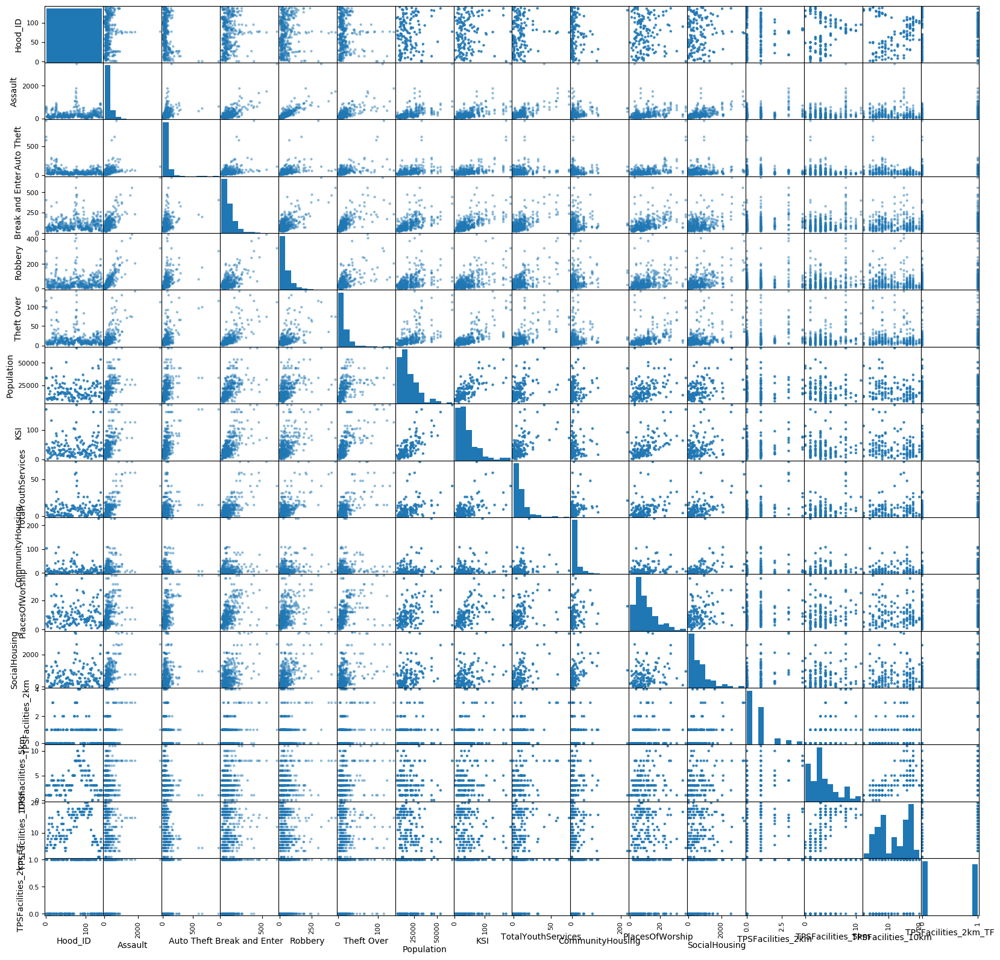

In [97]:
pd.plotting.scatter_matrix(join, figsize=(20, 20));

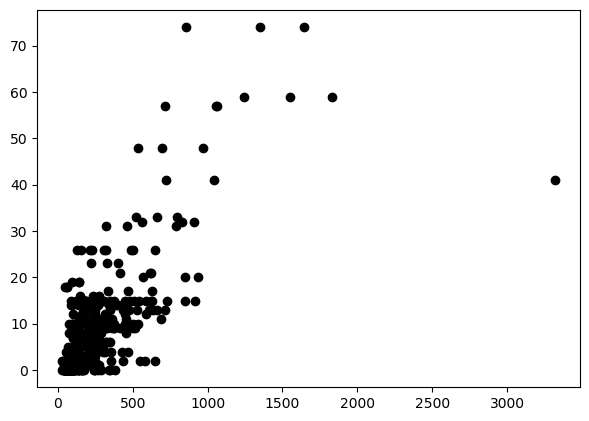

In [107]:
plt.scatter(join['Assault'],join['TotalYouthServices'],color='black')

##### Correlation Matrix

In [81]:
rs = np.random.RandomState(0)

corr = join.corr()
corr.style.background_gradient(cmap='coolwarm')

,Hood_ID,Assault,Auto Theft,Break and Enter,Robbery,Theft Over,Population,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km,TPSFacilities_2km_TF
Hood_ID,1.000000,0.088791,-0.216463,0.109709,0.076992,-0.084099,0.114776,0.096794,0.098788,0.021738,0.017663,0.103208,0.012357,0.129036,0.106841,0.039961
Assault,0.088791,1.000000,0.346768,0.743924,0.826618,0.704447,0.584331,0.616584,0.728539,0.233935,0.294587,0.614086,0.324436,0.227759,-0.077832,0.213588
Auto Theft,-0.216463,0.346768,1.000000,0.387127,0.482486,0.576447,0.390334,0.545510,0.180838,0.058366,0.522715,0.143366,-0.055801,-0.157501,-0.265727,-0.055803
Break and Enter,0.109709,0.743924,0.387127,1.000000,0.681678,0.724460,0.618645,0.679354,0.681679,0.112326,0.457130,0.509234,0.266275,0.268624,-0.017162,0.143593
Robbery,0.076992,0.826618,0.482486,0.681678,1.000000,0.579915,0.473432,0.542785,0.651832,0.230614,0.355113,0.547946,0.222342,0.144252,-0.112284,0.138507
Theft Over,-0.084099,0.704447,0.576447,0.724460,0.579915,1.000000,0.560334,0.722801,0.646336,0.080652,0.470380,0.396231,0.224308,0.218448,-0.048384,0.139958
Population,0.114776,0.584331,0.390334,0.618645,0.473432,0.560334,1.000000,0.750375,0.431380,0.273493,0.391122,0.457527,0.047046,-0.054536,-0.258641,0.024142
KSI,0.096794,0.616584,0.545510,0.679354,0.542785,0.722801,0.750375,1.000000,0.523735,0.160748,0.565292,0.401706,0.147503,0.057908,-0.206832,0.039294
TotalYouthServices,0.098788,0.728539,0.180838,0.681679,0.651832,0.646336,0.431380,0.523735,1.000000,0.230480,0.326126,0.632070,0.451535,0.371238,0.130065,0.287305
CommunityHousing,0.021738,0.233935,0.058366,0.112326,0.230614,0.080652,0.273493,0.160748,0.230480,1.000000,0.172585,0.423892,0.059854,-0.019611,-0.103029,0.133938


#### Visual Correlation Matrix

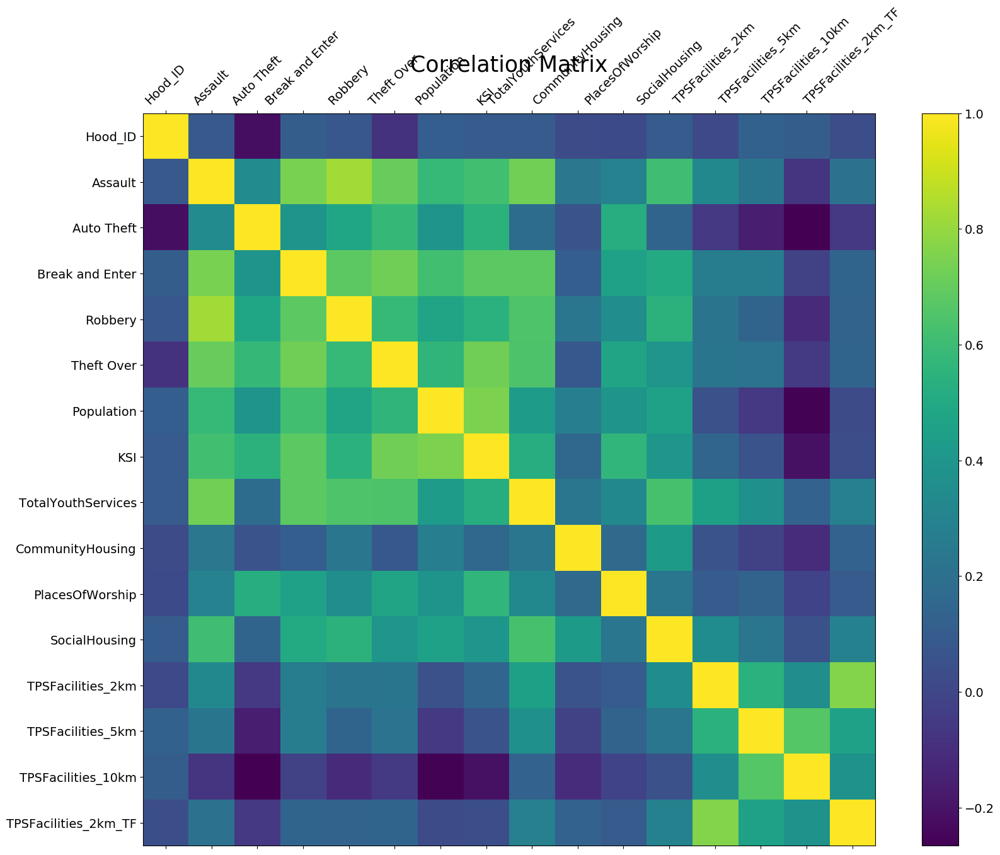

In [99]:
f = plt.figure(figsize=(19, 15))
plt.matshow(join.corr(), fignum=f.number)
plt.xticks(range(join.select_dtypes(['number']).shape[1]), join.select_dtypes(['number']).columns, fontsize=14, rotation=45)
plt.yticks(range(join.select_dtypes(['number']).shape[1]), join.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=25);

## Encode Categorical variable Time of Day (TOD)

In [113]:
encoded = pd.get_dummies(join, columns=['TOD'],drop_first=False)
encoded

,Hood_ID,Assault,Auto Theft,Break and Enter,Robbery,Theft Over,Population,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km_TF,TOD_Afternoon,TOD_Morning,TOD_Night
0,1,619,659,197,171,99,33312,170,15,6,37,950,0,1,0,0
1,1,451,600,225,76,96,33312,170,15,6,37,950,0,0,1,0
2,1,729,936,404,303,115,33312,170,15,6,37,950,0,0,0,1
3,2,635,125,68,201,7,32954,52,13,103,4,1288,1,1,0,0
4,2,350,76,58,70,12,32954,52,13,103,4,1288,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,139,208,18,95,17,6,16724,36,2,3,5,788,0,0,1,0
416,139,438,48,88,83,5,16724,36,2,3,5,788,0,0,0,1
417,140,89,2,19,19,5,9917,12,0,0,3,48,0,1,0,0
418,140,92,6,43,4,4,9917,12,0,0,3,48,0,0,1,0


In [114]:
encoded.to_csv("2_Output/xY_encoded.csv")

In [65]:
df=pd.read_csv("2_Output/xY_encoded.csv")
df=df.drop(['Unnamed: 0'], axis=1)

In [80]:
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')

,Hood_ID,Assault,Auto Theft,Break and Enter,Robbery,Theft Over,Population,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km_TF,TOD_Afternoon,TOD_Morning,TOD_Night
Hood_ID,1.000000,0.088791,-0.216463,0.109709,0.076992,-0.081129,0.114776,0.096794,0.098788,0.021738,0.017663,0.103208,0.039961,0.000000,0.000000,0.000000
Assault,0.088791,1.000000,0.346768,0.743924,0.826618,0.704717,0.584331,0.616584,0.728539,0.233935,0.294587,0.614086,0.213588,0.034118,-0.184539,0.150420
Auto Theft,-0.216463,0.346768,1.000000,0.387127,0.482486,0.576964,0.390334,0.545510,0.180838,0.058366,0.522715,0.143366,-0.055803,-0.043704,-0.186883,0.230587
Break and Enter,0.109709,0.743924,0.387127,1.000000,0.681678,0.725382,0.618645,0.679354,0.681679,0.112326,0.457130,0.509234,0.143593,-0.131223,-0.013880,0.145103
Robbery,0.076992,0.826618,0.482486,0.681678,1.000000,0.580354,0.473432,0.542785,0.651832,0.230614,0.355113,0.547946,0.138507,0.054414,-0.352485,0.298071
Theft Over,-0.081129,0.704717,0.576964,0.725382,0.580354,1.000000,0.561835,0.723677,0.647148,0.082117,0.471095,0.394370,0.143223,0.087303,-0.065521,-0.021782
Population,0.114776,0.584331,0.390334,0.618645,0.473432,0.561835,1.000000,0.750375,0.431380,0.273493,0.391122,0.457527,0.024142,-0.000000,-0.000000,-0.000000
KSI,0.096794,0.616584,0.545510,0.679354,0.542785,0.723677,0.750375,1.000000,0.523735,0.160748,0.565292,0.401706,0.039294,-0.000000,-0.000000,-0.000000
TotalYouthServices,0.098788,0.728539,0.180838,0.681679,0.651832,0.647148,0.431380,0.523735,1.000000,0.230480,0.326126,0.632070,0.287305,0.000000,0.000000,0.000000
CommunityHousing,0.021738,0.233935,0.058366,0.112326,0.230614,0.082117,0.273493,0.160748,0.230480,1.000000,0.172585,0.423892,0.133938,-0.000000,-0.000000,0.000000
